##### Sami Ramzi Chibane ©

In [1]:
import osmnx as ox
from IPython.display import Image
import geopandas as gpd
%matplotlib inline
ox.config(log_console=True, use_cache=True)
ox.__version__

'1.0.1'

In [2]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.cm as cm

In [3]:
import warnings
with warnings.catch_warnings():
    warnings.filterwarnings("ignore", category=FutureWarning)

In [4]:
import time
import pandas as pd
import numpy as np
import networkx as nx
import osmnx as ox
import matplotlib.cm as cm
import matplotlib.colors as colors

In [5]:
remove_stops_outsidebbox = True
append_definitions = True

#### Premièrement, il est possible de télécharger et de visualiser le réseau, en indiquant les cordonnées d'un point, le type du réseeau routier et le raton en mètres autour du point. L'exemple suivant concerne le réseau piéton d'un point localisé à Bengaluru en Inde 

C:\Users\Chibane\anaconda3\envs\ox\lib\site-packages\osmnx\utils_geo.py:280: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for polygon in geometry:
C:\Users\Chibane\anaconda3\envs\ox\lib\site-packages\osmnx\utils_geo.py:374: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for poly in multipoly:
C:\Users\Chibane\anaconda3\envs\ox\lib\site-packages\osmnx\utils_geo.py:374: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for poly in multipoly:


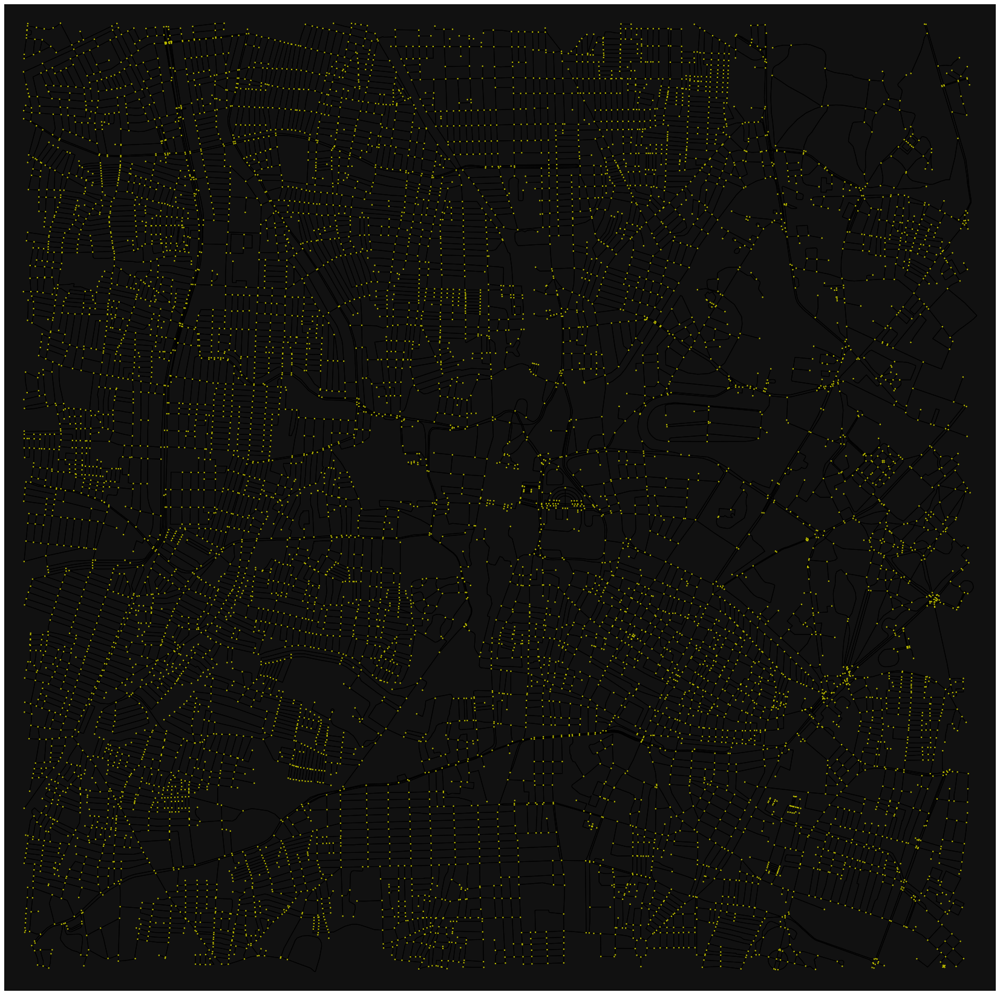

In [11]:
G = ox.graph_from_point(( 12.978052, 77.568371 ), dist=3000, network_type="walk")
fig, ax = ox.plot_graph(G, figsize=(30, 30), node_size=6, edge_color="k", edge_linewidth=1, node_color="y") 

C:\Users\Chibane\anaconda3\envs\ox\lib\site-packages\osmnx\utils_geo.py:280: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for polygon in geometry:
C:\Users\Chibane\anaconda3\envs\ox\lib\site-packages\osmnx\utils_geo.py:374: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for poly in multipoly:
C:\Users\Chibane\anaconda3\envs\ox\lib\site-packages\osmnx\utils_geo.py:374: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for poly in multipoly:


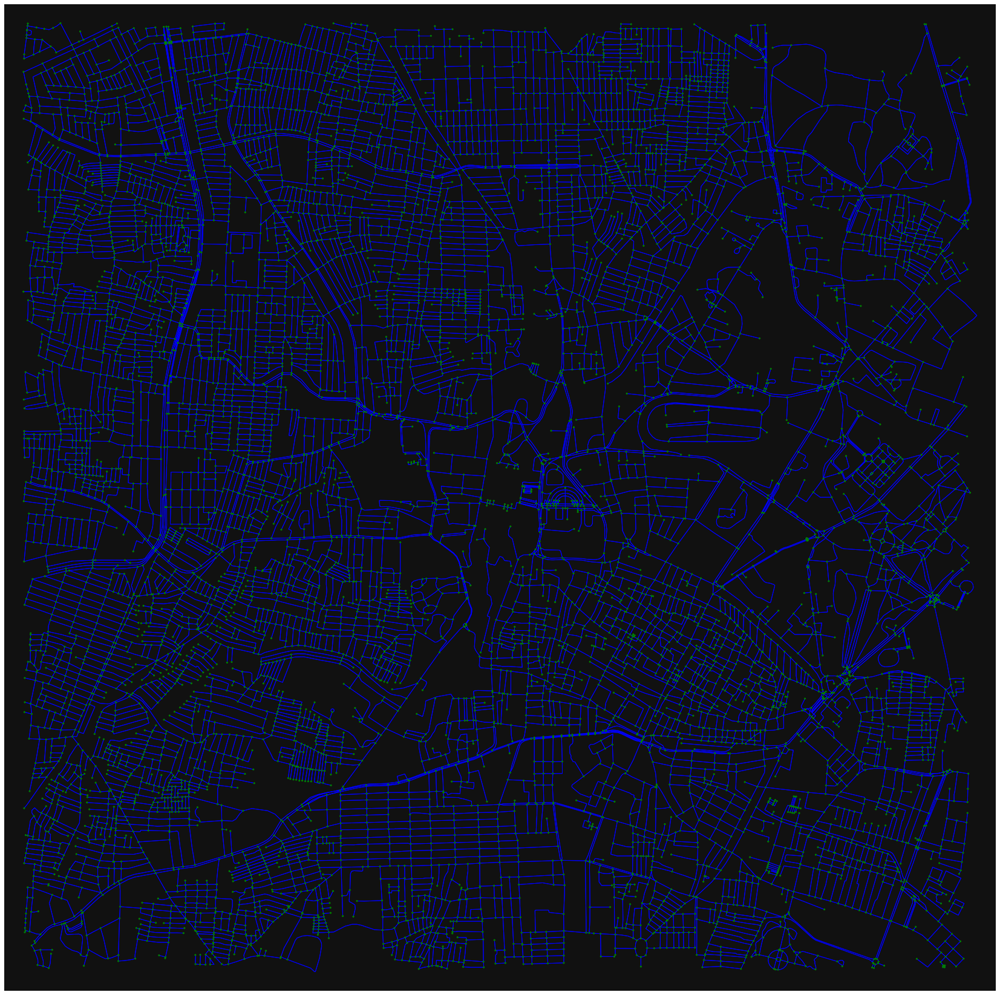

In [36]:
G = ox.graph_from_point(( 12.978052, 77.568371), dist=3000, network_type="walk")
fig, ax = ox.plot_graph(G, figsize=(30, 30), node_size=10, edge_color="b", edge_linewidth=1, node_color="g") 

#### Deuxièmement, il est possible de calculer et d'afficher des isochrones représentant l'accès à pied à partir d'un point et à partir d'une vitesse moyenne de déplacement piéton. Je reprends ici les coordonnées du même point , j'indique quatre paliers de temps déplacement, soit 5, 10, 15 et 20 minutes.

In [34]:
from shapely.geometry import Point, Polygon, LineString
from descartes import PolygonPatch

In [56]:
network_type = 'walk'
trip_times = [5, 10, 15, 20] #en minutes

travel_speed = 4 #vitesse moyenne de déplacement à pied en km/h

In [57]:
G = ox.graph_from_point((12.978052, 77.568371), dist=3000)

C:\Users\Chibane\anaconda3\envs\ox\lib\site-packages\osmnx\utils_geo.py:280: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for polygon in geometry:
C:\Users\Chibane\anaconda3\envs\ox\lib\site-packages\osmnx\utils_geo.py:374: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for poly in multipoly:
C:\Users\Chibane\anaconda3\envs\ox\lib\site-packages\osmnx\utils_geo.py:374: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for poly in multipoly:


In [58]:
G

In [59]:
gdf_nodes = ox.graph_to_gdfs(G, edges=False)
x, y = gdf_nodes['geometry'].unary_union.centroid.xy
center_node = ox.get_nearest_node(G, (y[0], x[0]))
G = ox.project_graph(G)

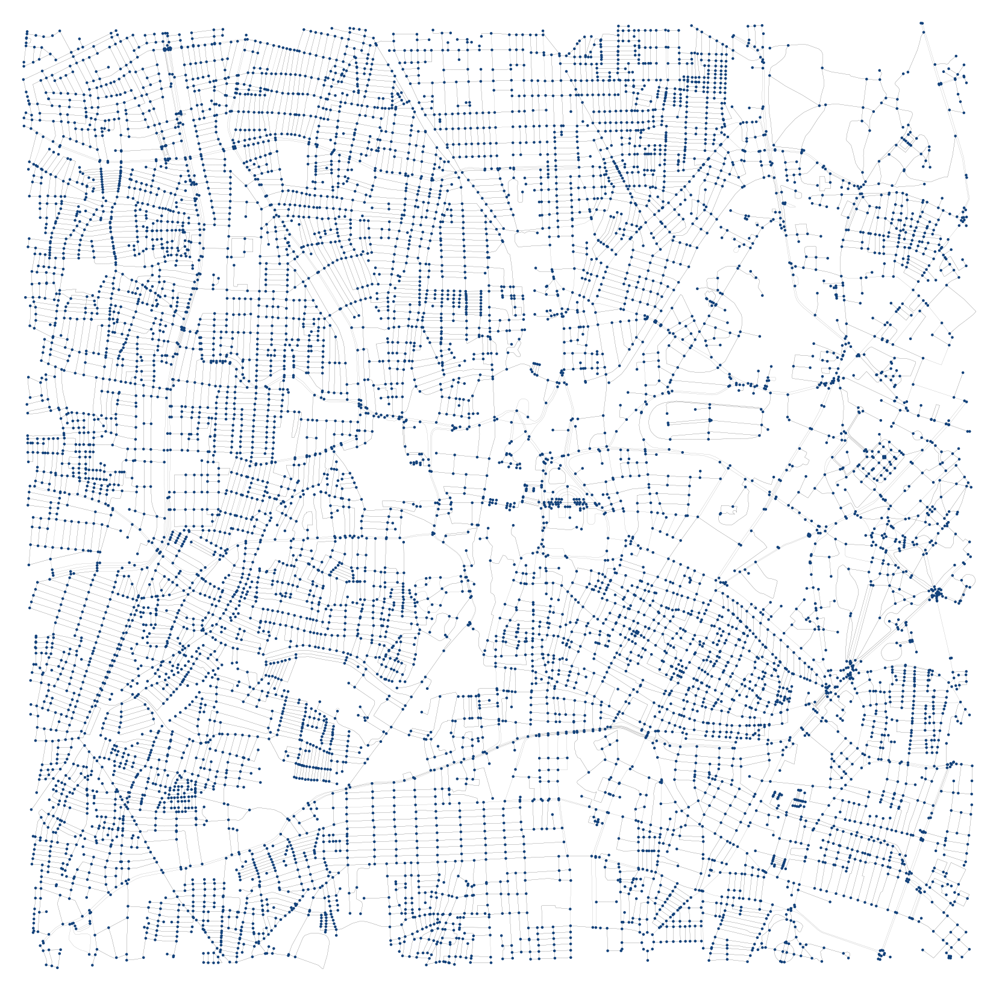

In [60]:
fig, ax = ox.plot_graph(G, figsize=(30, 30), 
                        edge_color='#000000', edge_linewidth=0.1, bgcolor="w",
                        edge_alpha=1, node_zorder=2, node_size=20, node_color='#12417a')

Next step (and this is all still just from the notebook) is to add the impedance between edges (the cost to walk from one node to another):

In [61]:
# add an edge attribute for time in minutes required to traverse each edge

meters_per_minute = travel_speed * 1000 / 60 #km per hour to m per minute

for u, v, k, data in G.edges(data=True, keys=True):
    data['time'] = data['length'] / meters_per_minute

And now generate the iso colors for when we plot access levels:

In [62]:
# get one color for each isochrone

iso_colors = ox.plot.get_colors(n=len(trip_times), cmap='Reds', start=0.3, return_hex=True)

Let’s run the first version from the notebook, which plots each node and buffers them slightly as well as colors them. This is one way to show accessibility from the original center node:

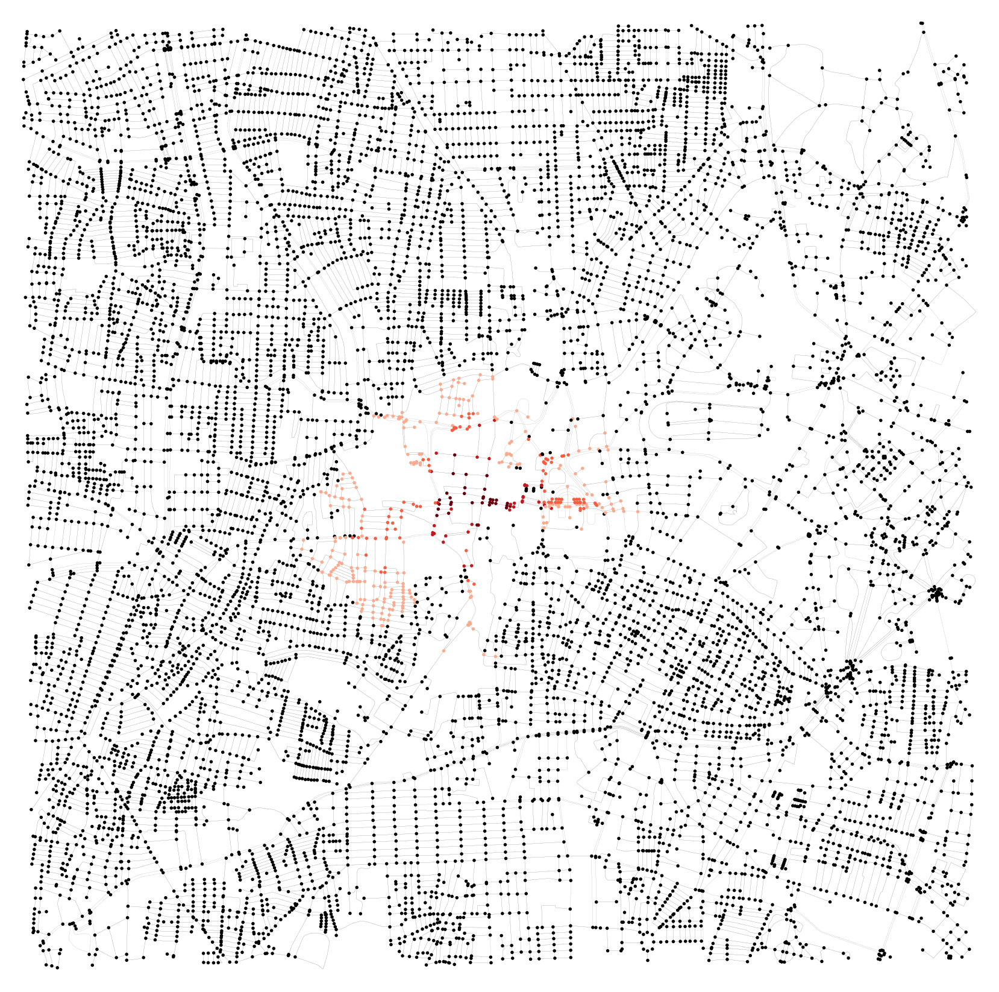

In [46]:
# color the nodes according to isochrone then plot the street network

node_colors = {}
for trip_time, color in zip(sorted(trip_times, reverse=True), iso_colors):
    subgraph = nx.ego_graph(G, center_node, radius=trip_time, distance='time')
    for node in subgraph.nodes():
        node_colors[node] = color
nc = [node_colors[node] if node in node_colors else 'none' for node in G.nodes()]
ns = [20 if node in node_colors else 0 for node in G.nodes()]
fig, ax = ox.plot_graph(G, node_color=nc, node_size=30, node_alpha=1, bgcolor="w",
                        node_zorder=1, figsize=(30, 30),
                        edge_linewidth=0.2, edge_alpha=1)

In [ ]:
# color the nodes according to isochrone then plot the street network

node_colors = {}
for trip_time, color in zip(sorted(trip_times, reverse=True), iso_colors):
    subgraph = nx.ego_graph(G, center_node, radius=trip_time, distance='time')
    for node in subgraph.nodes():
        node_colors[node] = color
nc = [node_colors[node] if node in node_colors else 'none' for node in G.nodes()]
ns = [20 if node in node_colors else 0 for node in G.nodes()]
fig, ax = ox.plot_graph(G, node_color=nc, node_size=30, node_alpha=1, bgcolor="w",
                        node_zorder=1, figsize=(30, 30),
                        edge_linewidth=0.2, edge_alpha=1)

#### Augmentons la vitesse de déplacement (8 km/h) de notre marcheur pour voir la zone à laquelle il accède finalement 

In [47]:
travel_speed = 8

In [49]:
trip_times = [5, 10, 15, 20] #en minutes

In [50]:
G = ox.graph_from_point((12.978052, 77.568371), dist=3000)

C:\Users\Chibane\anaconda3\envs\ox\lib\site-packages\osmnx\utils_geo.py:280: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for polygon in geometry:
C:\Users\Chibane\anaconda3\envs\ox\lib\site-packages\osmnx\utils_geo.py:374: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for poly in multipoly:
C:\Users\Chibane\anaconda3\envs\ox\lib\site-packages\osmnx\utils_geo.py:374: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for poly in multipoly:


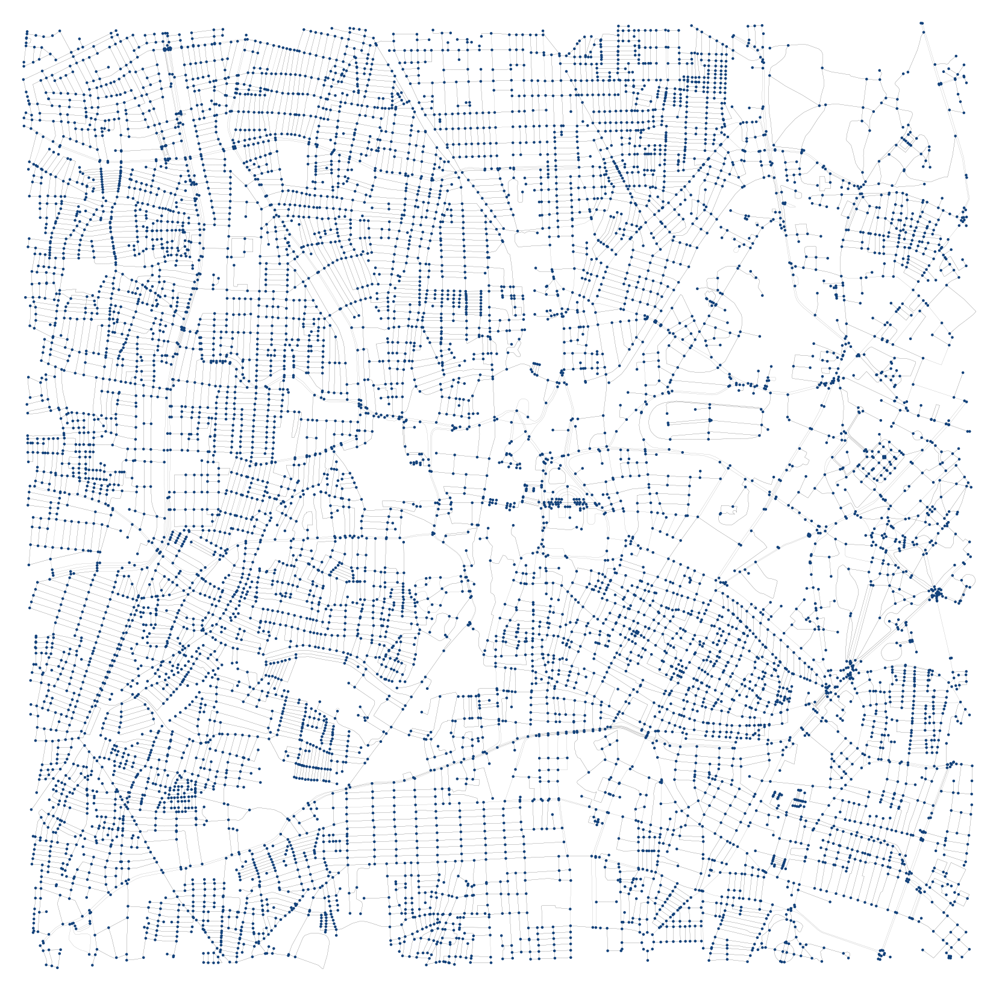

In [63]:
fig, ax = ox.plot_graph(G, figsize=(30, 30), 
                        edge_color='#000000', edge_linewidth=0.1, bgcolor="w",
                        edge_alpha=1, node_zorder=2, node_size=20, node_color='#12417a')

In [52]:
gdf_nodes = ox.graph_to_gdfs(G, edges=False)
x, y = gdf_nodes['geometry'].unary_union.centroid.xy
center_node = ox.get_nearest_node(G, (y[0], x[0]))
G = ox.project_graph(G)

In [53]:
# add an edge attribute for time in minutes required to traverse each edge

meters_per_minute = travel_speed * 1000 / 60 #km per hour to m per minute

for u, v, k, data in G.edges(data=True, keys=True):
    data['time'] = data['length'] / meters_per_minute

In [54]:
# get one color for each isochrone

iso_colors = ox.plot.get_colors(n=len(trip_times), cmap='Reds', start=0.3, return_hex=True)

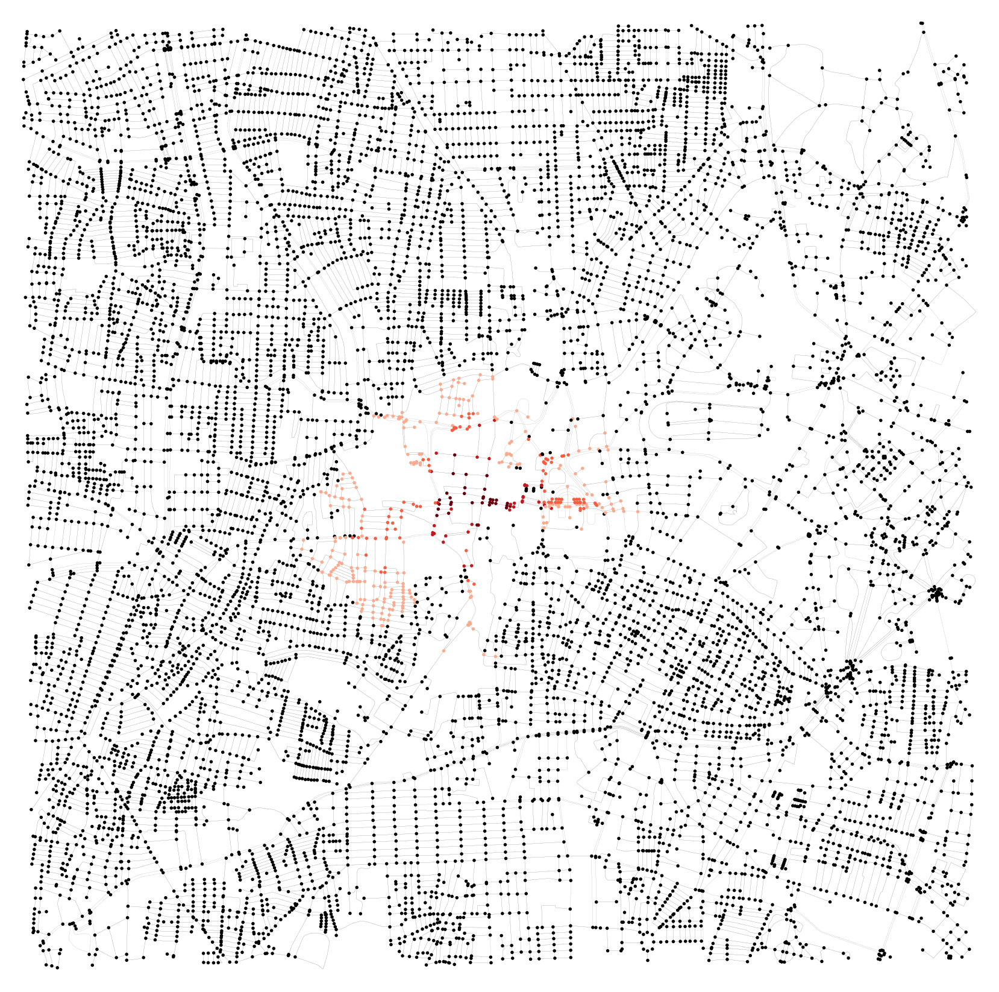

In [74]:
# color the nodes according to isochrone then plot the street network

node_colors = {}
for trip_time, color in zip(sorted(trip_times, reverse=True), iso_colors):
    subgraph = nx.ego_graph(G, center_node, radius=trip_time, distance='time')
    for node in subgraph.nodes():
        node_colors[node] = color
nc = [node_colors[node] if node in node_colors else 'none' for node in G.nodes()]
ns = [20 if node in node_colors else 0 for node in G.nodes()]
fig, ax = ox.plot_graph(G, node_color=nc, node_size=30, node_alpha=1, bgcolor="w",
                        node_zorder=1, figsize=(30, 30),
                        edge_linewidth=0.2, edge_alpha=1)

##### On constate que la "zone de chalandise" de notre marcheur à largement augmentée ! 

#### Enfin, l'exemple ci-après est celui de l'accessibilité du réseau praticable à pied à partir du point dont les cordonnées sont ceux du musée du Louvre à Paris en France 

In [33]:
G1 = ox.graph_from_point((48.860720, 2.337351), dist=4000, network_type="walk")

In [34]:
 gdf_nodes = ox.graph_to_gdfs(G1, edges=False)
x, y = gdf_nodes['geometry'].unary_union.centroid.xy
center_node = ox.get_nearest_node(G1, (y[0], x[0]))
G1 = ox.project_graph(G1)

C:\Users\s.chibane\.conda\envs\ox\lib\site-packages\osmnx\distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)


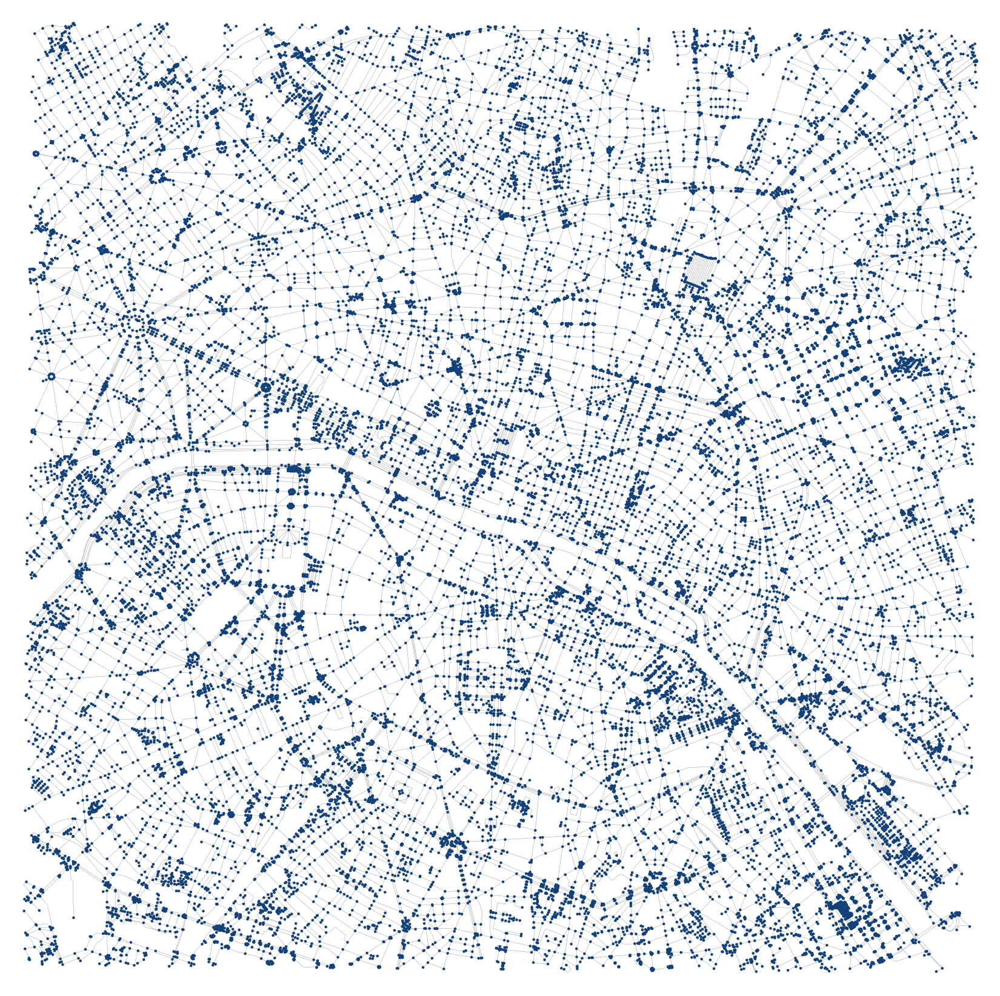

In [35]:
fig, ax = ox.plot_graph(G1, figsize=(30, 30), 
                        edge_color='#000000', edge_linewidth=0.1, bgcolor="w", dpi=1200,
                        edge_alpha=1, node_zorder=2, node_size=20, node_color='#12417a')

In [36]:
network_type = 'walk'
trip_times = [5, 10, 15, 20, 25, 30] #in minutes

travel_speed = 4 #walking speed in km/hour

In [37]:
# add an edge attribute for time in minutes required to traverse each edge

meters_per_minute = travel_speed * 1000 / 60 #km per hour to m per minute

for u, v, k, data in G1.edges(data=True, keys=True):
    data['time'] = data['length'] / meters_per_minute

In [38]:
# get one color for each isochrone

iso_colors = ox.plot.get_colors(n=len(trip_times), cmap='Reds', start=0.3, return_hex=True)

In [40]:
# get one color for each isochrone

iso_colors = ox.plot.get_colors(n=len(trip_times), cmap='Greens', start=0.3, return_hex=True)

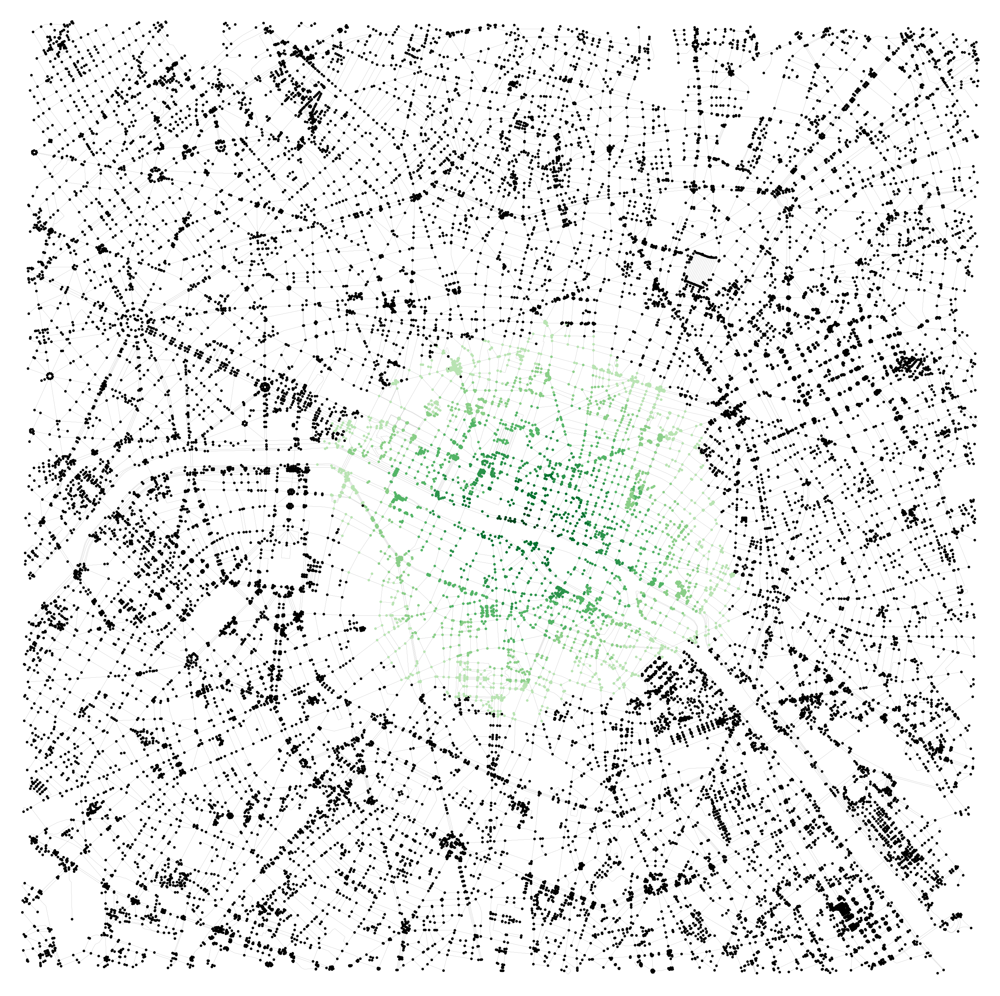

In [41]:
# color the nodes according to isochrone then plot the street network

node_colors = {}
for trip_time, color in zip(sorted(trip_times, reverse=True), iso_colors):
    subgraph = nx.ego_graph(G1, center_node, radius=trip_time, distance='time')
    for node in subgraph.nodes():
        node_colors[node] = color
nc = [node_colors[node] if node in node_colors else 'none' for node in G1.nodes()]
ns = [20 if node in node_colors else 0 for node in G1.nodes()]
fig, ax = ox.plot_graph(G1, node_color=nc, node_size=50, node_alpha=1, bgcolor="w",
                        node_zorder=1, figsize=(50, 50), dpi=1200,
                        edge_linewidth=0.2, edge_alpha=1)